## Camera Calibration used OpenCV
**chessboard images for calibration and test run images**

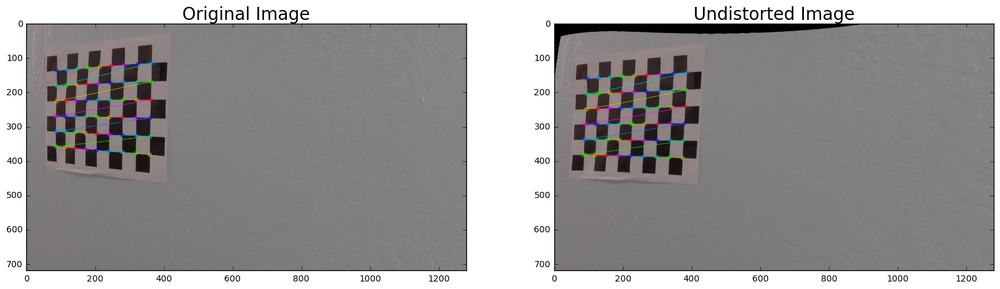

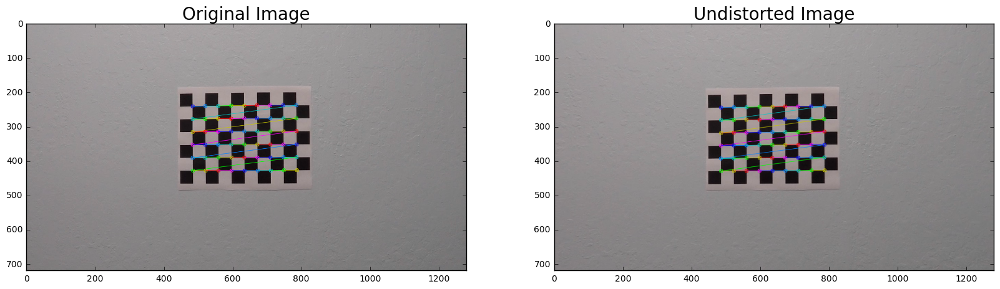

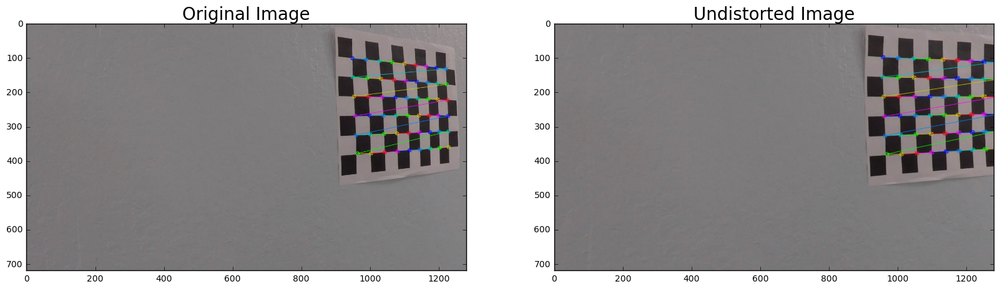

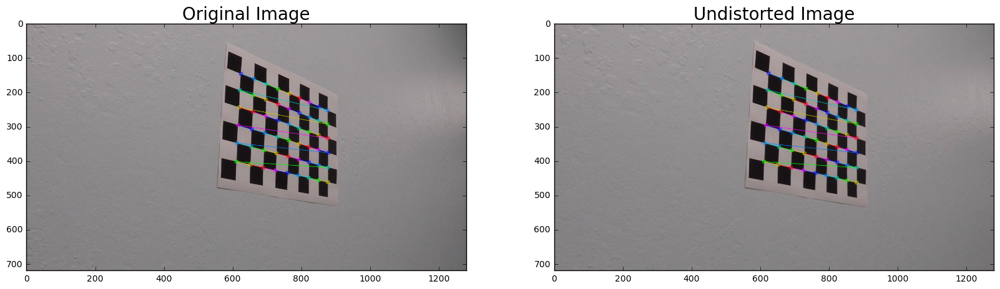

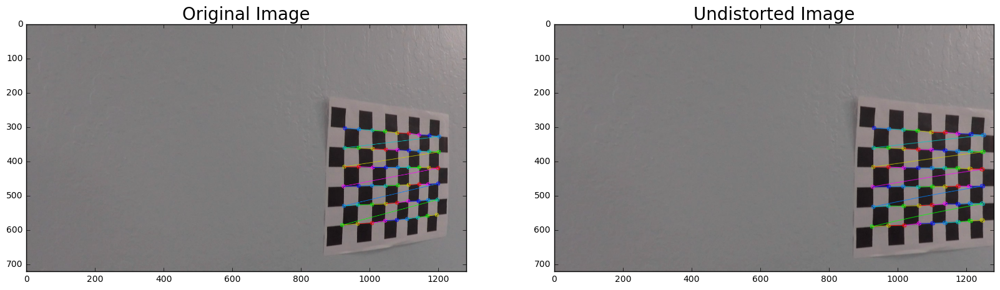

...

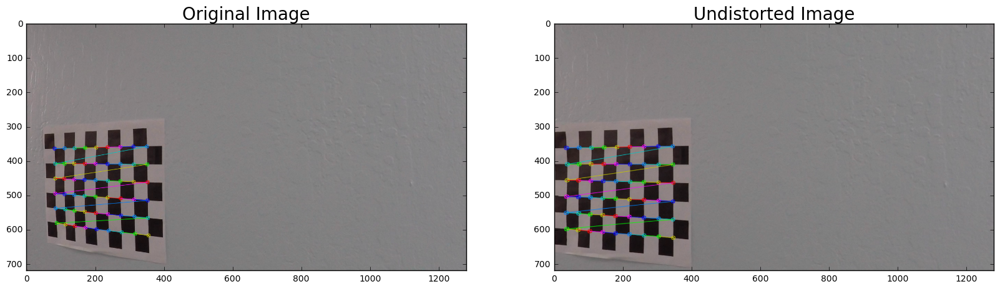

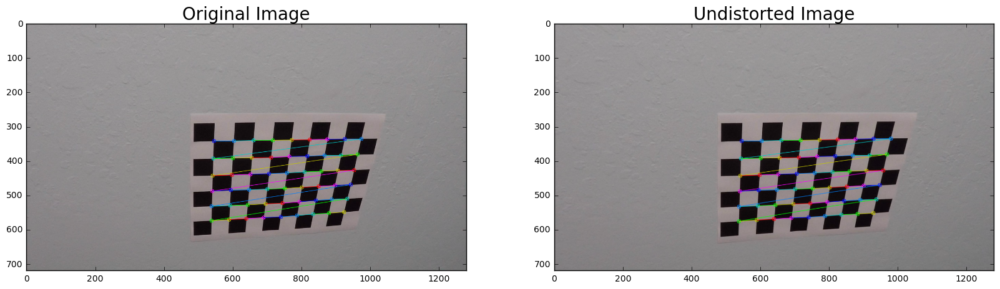

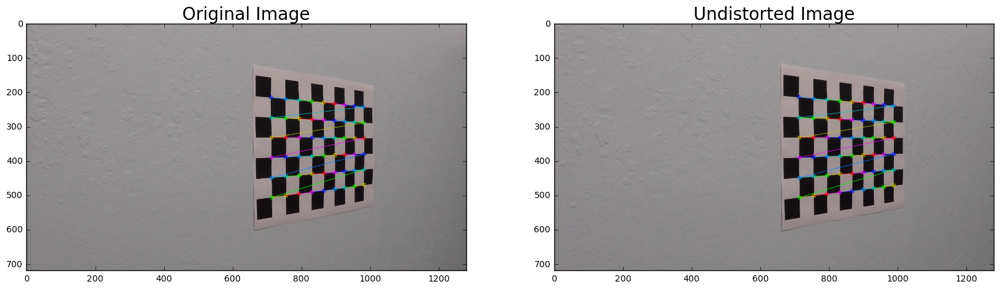

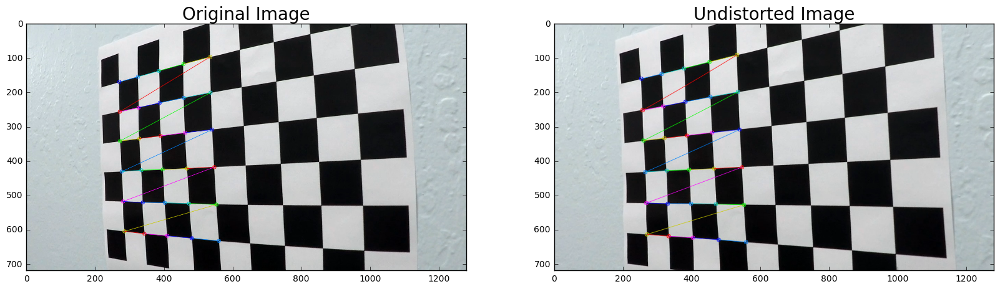

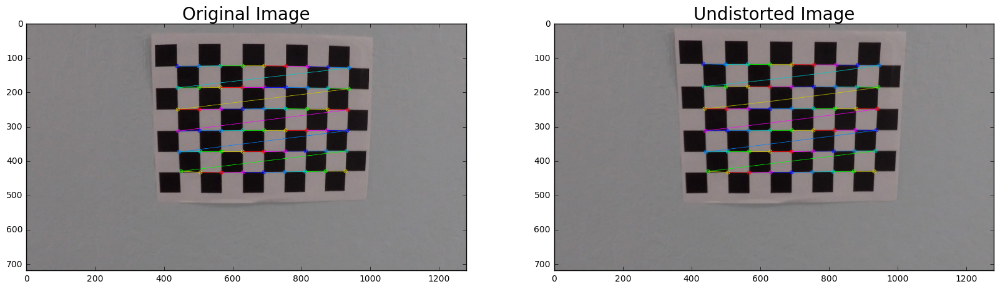

In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.gridspec as gridspec
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import re
%matplotlib inline

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
# all combination dimension
objp1 = np.zeros((6*9, 3), np.float32)
objp1[:, :2] = np.mgrid[0:9, 0:6].T.reshape(-1, 2)
objp2 = np.zeros((6*8, 3), np.float32)
objp2[:, :2] = np.mgrid[0:8, 0:6].T.reshape(-1, 2)
objp3 = np.zeros((5*9, 3), np.float32)
objp3[:, :2] = np.mgrid[0:9, 0:5].T.reshape(-1, 2)
objp4 = np.zeros((4*9, 3), np.float32)
objp4[:, :2] = np.mgrid[0:9, 0:4].T.reshape(-1, 2)
objp5 = np.zeros((6*7, 3), np.float32)
objp5[:, :2] = np.mgrid[0:7, 0:6].T.reshape(-1, 2)
objp6 = np.zeros((6*5, 3), np.float32)
objp6[:, :2] = np.mgrid[0:5, 0:6].T.reshape(-1, 2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    img_size = (img.shape[1], img.shape[0])
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9, 6), None)
    objp = objp1
    if not ret:
        ret, corners = cv2.findChessboardCorners(gray, (8, 6), None)
        objp = objp2
    if not ret:
        ret, corners = cv2.findChessboardCorners(gray, (9, 5), None)
        objp = objp3
    if not ret:
        ret, corners = cv2.findChessboardCorners(gray, (9, 4), None)
        objp = objp4
    if not ret:
        ret, corners = cv2.findChessboardCorners(gray, (7, 6), None)
        objp = objp5
    if not ret:
        ret, corners = cv2.findChessboardCorners(gray, (5, 6), None)
        objp = objp6
        
    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (corners.shape[1], corners.shape[0]), corners, ret)
        # Do camera calibration given object points and image points
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
        dst = cv2.undistort(img, mtx, dist, None, mtx)
        
        # Visualize undistortion
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=20)
        ax2.imshow(dst)
        ax2.set_title('Undistorted Image', fontsize=20)
plt.show()

##Apply camera calibration result on raw images.
**2 images test run for calibration result** 

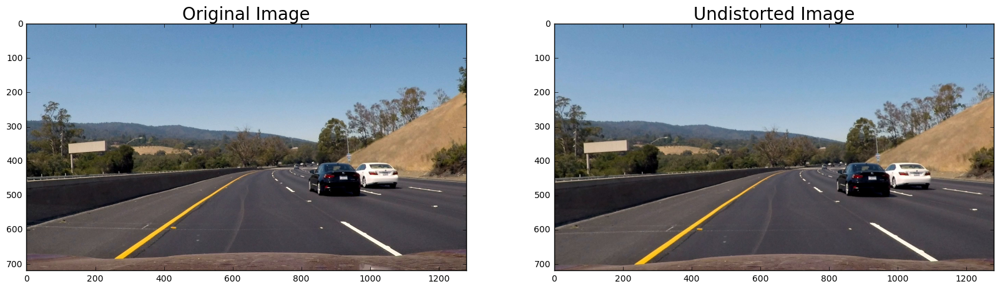

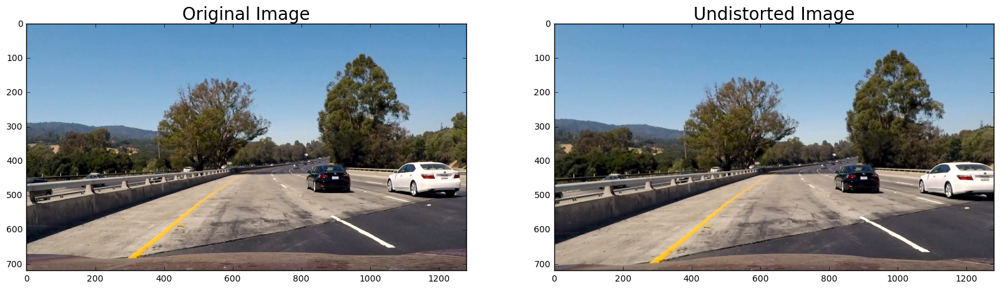

In [2]:
def undistort_img(img):
    return cv2.undistort(img, mtx, dist, None, mtx)

# Load test image
img_path = glob.glob("test_img/*.jpg")

# loop through and display test images
for idx, fname in enumerate(img_path):
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_size = (img.shape[1], img.shape[0])
        
    # process image
    img_ = undistort_img(img)
        
    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(img_)
    ax2.set_title('Undistorted Image', fontsize=20)
        
plt.show()

##Color and Gradient Processing

In [7]:
def undistort_img(img):
    return cv2.undistort(img, mtx, dist, None, mtx)


# Use UV color space to filter out white and yellow
def yuv(image):
    uv = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
    u = uv[:, :, 1]
    v = uv[:, :, 2]
    ignore_color = np.copy(v)*0
    img = np.dstack((u, ignore_color, v))
    
    return img


# Perform blur operation to remove noise.
def gaussian_blur(img, kernel_size):
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)


# Exclude all spaces except white and yellow
def bitwise_yellow_white(image):
    lower_yellow_white = np.array([140, 140, 55])
    upper_yellow_white = np.array([255, 255, 255])
    mask = cv2.inRange(image, lower_yellow_white, upper_yellow_white)
    
    return cv2.bitwise_and(image, image, mask=mask)


# Use edge detection to extract lines from the frame
def canny(img, low_threshold, high_threshold, kernel_size):
    img = bitwise_yellow_white(img)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    blur_gray = gaussian_blur(gray, kernel_size)
    
    return cv2.Canny(blur_gray, low_threshold, high_threshold)


# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
def abs_sobel_thresh(img, orient='x', thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    ret, binary_output = cv2.threshold(scaled_sobel, thresh[0], thresh[1], cv2.THRESH_BINARY)
    
    # Return the result
    return binary_output


# Define a function to return the magnitude of the gradient
# for a given sobel kernel size and threshold values
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    ret, mag_binary = cv2.threshold(gradmag, mag_thresh[0], mag_thresh[1], cv2.THRESH_BINARY)
    
    return mag_binary


# Define a function to threshold an image for a given range and Sobel kernel
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    with np.errstate(divide='ignore', invalid='ignore'):
        absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
        binary_output = np.zeros_like(absgraddir).astype(np.float32)
        binary_output[(absgraddir > thresh[0]) & (absgraddir < thresh[1])] = 1

    np.nan_to_num(binary_output)
    binary_output[(binary_output > 0) | (binary_output < 0)] = 128
    
    return binary_output.astype(np.uint8)


# Define a function that thresholds the S-channel of HLS
def hls_s(img, thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:, :, 2]
    retval, binary_output = cv2.threshold(s_channel.astype('uint8'), thresh[0], thresh[1], cv2.THRESH_BINARY)
    
    return binary_output


# Define a function that thresholds the H-channel of HLS
def hls_h(img, thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    h_channel = hls[:, :, 0]
    retval, binary_output = cv2.threshold(h_channel.astype('uint8'), thresh[0], thresh[1], cv2.THRESH_BINARY)
    
    return binary_output

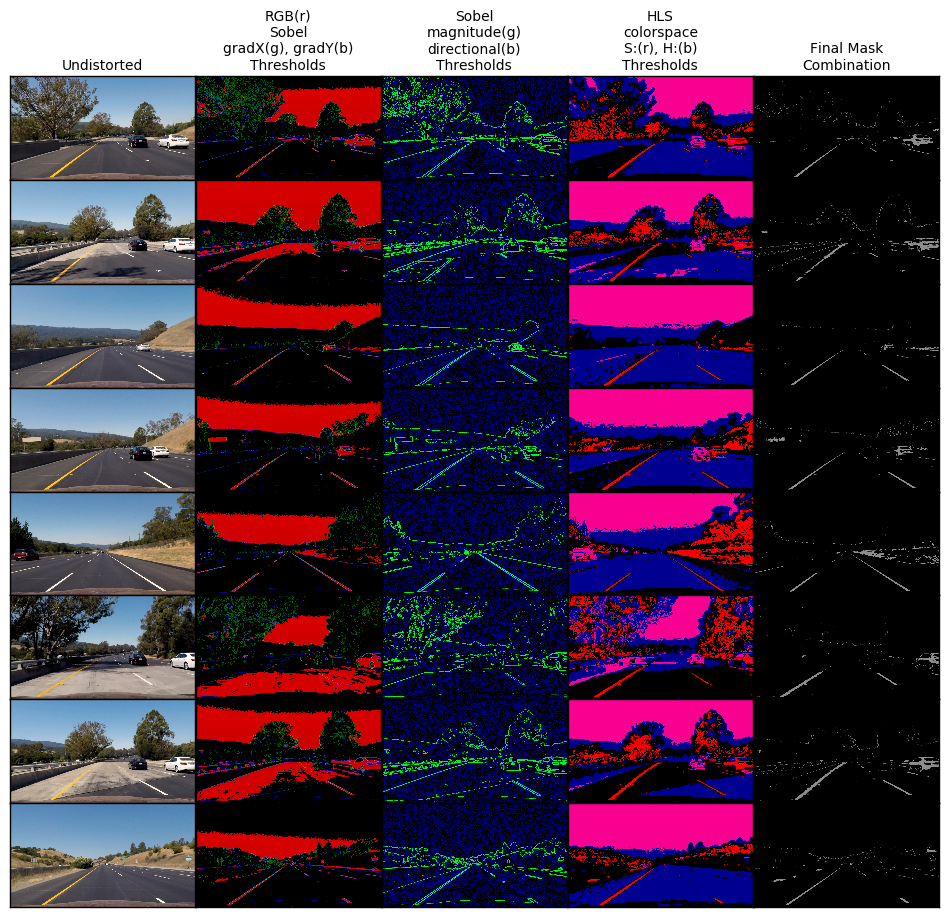

In [11]:
# Make a list of test images
filepath = "test_img/"
pattern = re.compile("^.+processed.jpg$")
images = glob.glob(filepath+'*.jpg')

# Setup plot
fig = plt.figure(figsize=(12, len(images)*1.34))
w_ratios = [1 for n in range(5)]
h_ratios = [1 for n in range(len(images))]
grid = gridspec.GridSpec(len(images), 5, wspace=0.0, hspace=0.0, width_ratios=w_ratios, height_ratios=h_ratios)
i = 0

# loop through and display test images and apply current pipeline in sequence to them
for idx, fname in enumerate(images):

    if not pattern.match(fname):
        img = cv2.imread(fname)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img_size = (img.shape[1], img.shape[0])
        
        # Run the functions
        img = undistort_img(img)
        gradx = abs_sobel_thresh(img, orient='x', thresh=(25, 100))
        grady = abs_sobel_thresh(img, orient='y', thresh=(50, 150))
        magch = mag_thresh(img, sobel_kernel=9, mag_thresh=(50, 250))
        dirch = dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.3))
        sch = hls_s(img, thresh=(88, 190))
        hch = hls_h(img, thresh=(50, 100))
    
        # Output "masked_lines" is a single channel mask
        shadow = np.zeros_like(dirch).astype(np.uint8)
        shadow[(sch > 0) & (hch > 0)] = 128

        ignore_color = np.copy(gradx)*0 # creating a blank color channel for combining

        rEdgeDetect = (img[:, :, 1] / 4).astype(np.uint8)
        rEdgeDetect = 255-rEdgeDetect
        rEdgeDetect[(rEdgeDetect > 215)] = 0

        combined = np.zeros_like(dirch).astype(np.uint8)
        combined[((gradx > 0) | (grady > 0) | ((magch > 0) & (dirch > 0)) | (sch > 0)) & (shadow == 0) & (rEdgeDetect > 0)] = 35
        #combined[((gradx > 0) | (grady > 0) | ((magch > 0) & (dirch > 0)) | (sch > 0)) & (rEdgeDetect > 0)] = 35
        img1 = np.dstack((rEdgeDetect, gradx, grady))
        img2 = np.dstack((ignore_color, magch, dirch))
        img3 = np.dstack((sch, shadow, hch))
        #img3 = np.dstack((sch, hch))
        img4 = np.dstack((combined, combined, combined))
        
        ax = plt.Subplot(fig, grid[i])
        ax.imshow(img)
        if i == 0:
            ax.set_title('Undistorted', size=10)
        ax.set_xticks([])
        ax.set_yticks([])
        fig.add_subplot(ax)
        i += 1
        # sobel gradx(r) and grady(g) thresholds
        ax = plt.Subplot(fig, grid[i])
        ax.imshow(img1)
        if i == 1:
            ax.set_title('RGB(r)\nSobel\ngradX(g), gradY(b)\nThresholds', size=10)
        ax.set_xticks([])
        ax.set_yticks([])
        fig.add_subplot(ax)
        i += 1
        # magnitude(g) and directional(b) thresholds
        ax = plt.Subplot(fig, grid[i])
        ax.imshow(img2)
        if i == 2:
            ax.set_title('Sobel\nmagnitude(g)\ndirectional(b)\nThresholds', size=10)
        ax.set_xticks([])
        ax.set_yticks([])
        fig.add_subplot(ax)
        i += 1
        # HLS colorspace analysis: (S: y) and (H: b) thresholds
        ax = plt.Subplot(fig, grid[i])
        ax.imshow(img3*4)
        if i==3:
            ax.set_title('HLS\ncolorspace\nS:(r), H:(b)\nThresholds', size=10)
        ax.set_xticks([])
        ax.set_yticks([])
        fig.add_subplot(ax)
        i += 1
        # Final Masking combination
        ax = plt.Subplot(fig, grid[i])
        if i == 4:
            ax.set_title('Final Mask\nCombination', size=10)
        ax.imshow(img4*4)
        ax.set_xticks([])
        ax.set_yticks([])
        fig.add_subplot(ax)
        i += 1

##Detect lane line and fit to boundary